In [31]:
import imageio.v2 as iio
import numpy as np
import matplotlib.pyplot as plt
import OpenEXR, Imath, array
import cv2

%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 12.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'
# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [23]:
# envmap_path = 'rainforest_trail_2k.exr'
envmap_path = 'qwantani_dusk_2_2k.exr'
hdr = iio.imread(envmap_path, format='EXR')

print(f"Image shape: {hdr.shape}")
print(f"Image dtype: {hdr.dtype}")


Image shape: (1024, 2048, 4)
Image dtype: float32


(2048, 1024)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0025987304..82.63393].


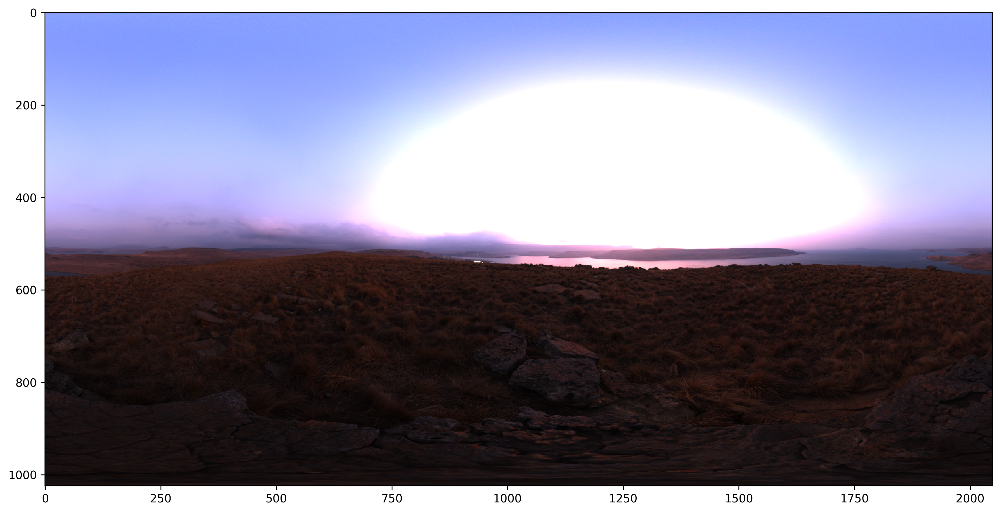

In [24]:
# ファイルを読み込む
pt = Imath.PixelType(Imath.PixelType.FLOAT)
img_exr = OpenEXR.InputFile(envmap_path)

# 読んだEXRファイルからRGBの値を取り出し
r_str, g_str, b_str = img_exr.channels('RGB', pt)
red = np.array(array.array('f', r_str))
green = np.array(array.array('f', g_str))
blue = np.array(array.array('f', b_str))

# 画像サイズを取得
dw = img_exr.header()['dataWindow']
size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)
print(size)

# openCVで使えるように並べ替え
img = np.array([[r, g, b] for r, g, b in zip(red, green, blue)])
img = img.reshape(size[1], size[0], 3)

# 画像を表示
plt.figure(dpi=300)
plt.imshow(img)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0025987304..82.63393].


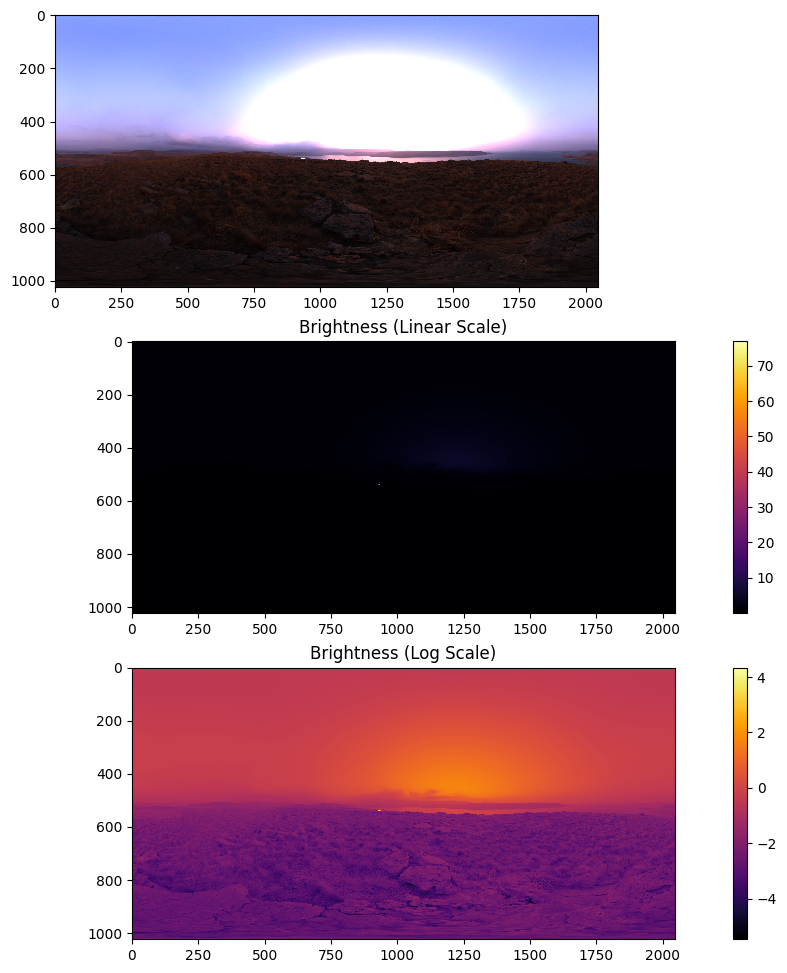

In [ ]:
# Calculate Brightness from RGB channels
R_coeff = 0.2126
G_coeff = 0.7152
B_coeff = 0.0722

brightness = img[:,:,0] * R_coeff + img[:,:,1] * G_coeff + img[:,:,2] * B_coeff

def log_scale(image, epsilon=1e-6):
    return np.log(image + epsilon)

brightness_log = log_scale(brightness)

# 線形スケールで輝度の画像を表示
plt.subplot(3, 1, 1)
plt.imshow(img)  # これはただ線形を圧縮してそのまま示ししているだけ

plt.subplot(3, 1, 2)
plt.imshow(brightness, cmap='inferno', interpolation='none')
plt.colorbar()
plt.title('Brightness (Linear Scale)')

# 対数スケールで輝度の画像を表示
plt.subplot(3, 1, 3)
plt.imshow(brightness_log, cmap='inferno', interpolation='none')
plt.colorbar()
plt.title('Brightness (Log Scale)')

# 画像を表示
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.9523478..4.41442].


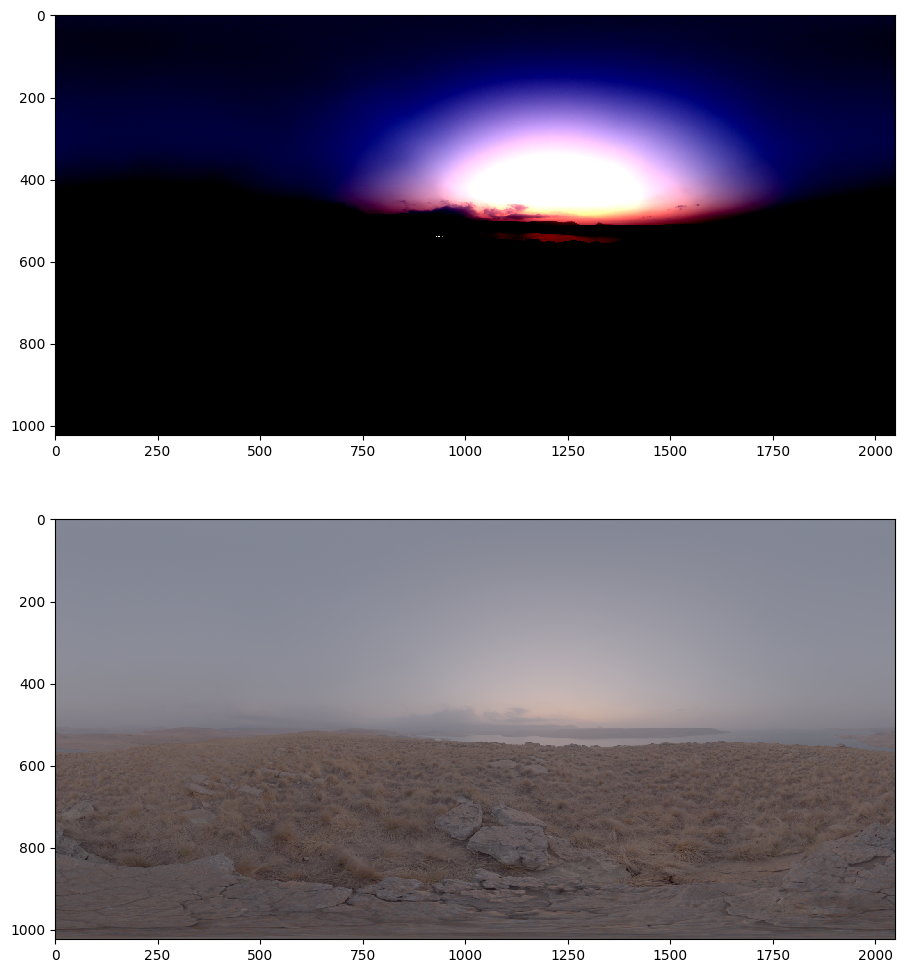

In [ ]:
img_log = log_scale(img)
plt.subplot(2, 1, 1)
plt.imshow(img_log)
# normalize the log-scaled image for display
img_log_norm = (img_log - img_log.min()) / (img_log.max() - img_log.min())  # 色味がそれぞにしして変わってううう?
plt.subplot(2, 1, 2)
plt.imshow(img_log_norm)

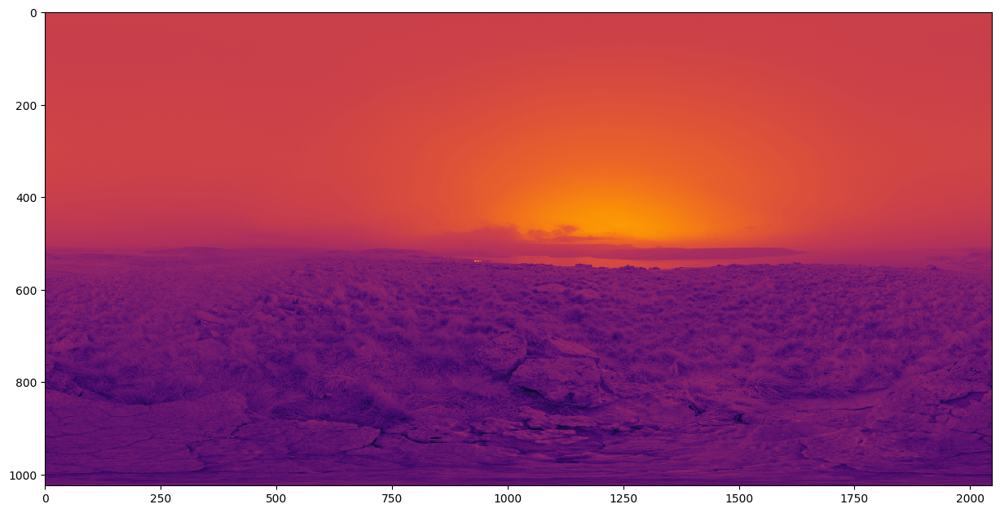

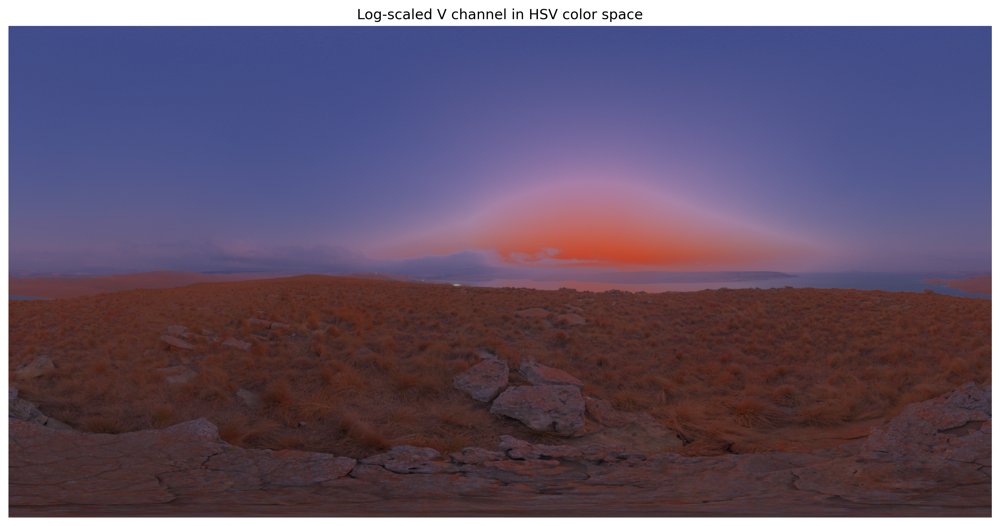

In [35]:
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

V = img_hsv[:, :, 2]  # Vチャンネルを抽出

V_log = log_scale(V)
plt.imshow(V_log, cmap='inferno', interpolation='none')

img_hsv_log = img_hsv.copy()
img_hsv_log[:, :, 2] = (V_log - V_log.min()) / (V_log.max() - V_log.min())  # Vチャンネルを対数スケールに変換

img_log = cv2.cvtColor(img_hsv_log, cv2.COLOR_HSV2RGB)
plt.figure(dpi=300)
plt.imshow(img_log)
plt.title('Log-scaled V channel in HSV color space')
plt.axis('off')
plt.show()